# Capstone Project

## PGDP - ML : 18/19 batch

### Members

Mr. Karan Mitra
Mr. Prabhakaran
Mr. Devanandh

### Mentor

Ms. Sulekha Aloorravi

## Problem Definition

A house value is simply more than location and square footage. Like the features that make up a person, an educated party would want to know all aspects that give a house its value. For example, you want to sell a house and you don’t know the price which you can take — it can’t be too low or too high. To find house price you usually try to find similar properties in your neighbourhood and based on gathered data you will try to assess your house price. 

### Objective 

Take advantage of all of the feature variables available below, use it to analyse and predict house prices. 

1.	cid: a notation for a house
2.	dayhours: Date house was sold
3.	room_bed: Number of Bedrooms/House
4.	room_bath: Number of bathrooms/bedrooms
5.	living_measure: square footage of the home
6.	lot_measure: quare footage of the lot
7.	ceil: Total floors (levels) in house
8.	coast: House which has a view to a waterfront
9.	sight: Has been viewed
10.	condition: How good the condition is (Overall)
11.	quality: grade given to the housing unit, based on grading system
12.	ceil_measure: square footage of house apart from basement
13.	basement_measure: square footage of the basement
14.	yr_built: Built Year
15.	yr_renovated: Year when house was renovated
16.	zipcode: zip
17.	lat: Latitude coordinate
18.	long: Longitude coordinate
19.	living_measure15: Living room area in 2015(implies-- some renovations) This might or might not have affected the lotsize area
20.	lot_measure15: lotSize area in 2015(implies-- some renovations)
21.	furnished: Based on the quality of room 23: total_area: Measure of both living and lot

### Target Variable

price: Price is prediction target


In [107]:
#Basic libraries import

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings("ignore")

In [4]:
# Importing dataset

house_df = pd.read_csv('innercity.csv')

# EDA and Pre-processing (Feature Engineering and Selection)

In [5]:
house_df.head(10)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3034200666,20141107T000000,808100,4,3.25,3020,13457,1.0,0,0,...,0,1956,0,98133,47.7174,-122.336,2120,7553,1,16477
1,8731981640,20141204T000000,277500,4,2.50,2550,7500,1.0,0,0,...,800,1976,0,98023,47.3165,-122.386,2260,8800,0,10050
2,5104530220,20150420T000000,404000,3,2.50,2370,4324,2.0,0,0,...,0,2006,0,98038,47.3515,-121.999,2370,4348,0,6694
3,6145600285,20140529T000000,300000,2,1.00,820,3844,1.0,0,0,...,0,1916,0,98133,47.7049,-122.349,1520,3844,0,4664
4,8924100111,20150424T000000,699000,2,1.50,1400,4050,1.0,0,0,...,0,1954,0,98115,47.6768,-122.269,1900,5940,0,5450
5,5525400430,20140715T000000,585000,3,2.50,2050,11690,2.0,0,0,...,0,1989,0,98059,47.5279,-122.161,2410,10172,1,13740
6,2419600075,20141201T000000,465000,3,1.75,1480,6360,1.0,0,0,...,0,1954,0,98133,47.7311,-122.353,1480,6360,0,7840
7,114101161,20140829T000000,480000,3,1.50,2100,67269,1.0,0,0,...,880,1949,0,98028,47.7592,-122.230,1610,15999,0,69369
8,7011201550,20140707T000000,780000,4,2.00,2600,4800,1.0,0,2,...,1200,1953,0,98119,47.6370,-122.371,2050,3505,0,7400
9,7203000640,20140918T000000,215000,4,1.00,1130,7400,1.0,0,0,...,0,1969,0,98003,47.3437,-122.316,1540,7379,0,8530


In [6]:
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
cid                 21613 non-null int64
dayhours            21613 non-null object
price               21613 non-null int64
room_bed            21613 non-null int64
room_bath           21613 non-null float64
living_measure      21613 non-null int64
lot_measure         21613 non-null int64
ceil                21613 non-null float64
coast               21613 non-null int64
sight               21613 non-null int64
condition           21613 non-null int64
quality             21613 non-null int64
ceil_measure        21613 non-null int64
basement            21613 non-null int64
yr_built            21613 non-null int64
yr_renovated        21613 non-null int64
zipcode             21613 non-null int64
lat                 21613 non-null float64
long                21613 non-null float64
living_measure15    21613 non-null int64
lot_measure15       21613 non-null int64
furnished           2

There are a total of 21613 data points. 

The input variables are all either integer or float datatype. 

The target variable(price) is of the datatype integer. 

Hence, we would look into regression based models to evaluate the integer target varible.

The "dayhours" column is of object type. Let's eyeball the data.



In [18]:
house_df['dayhours'].head(5)

0    20141107T000000
1    20141204T000000
2    20150420T000000
3    20140529T000000
4    20150424T000000
Name: dayhours, dtype: object

The first 4digits quanitfy the year, the next 2 digits the month and the next 2 digits the date and the last 7 digits probably the time stamp. Hence, splitting this variable into respective variable groups

## 'Dayhours' data manipulation

In [83]:
house_df_new=house_df.copy()

In [91]:
# creating a new column to mimic the timeframe
house_df_new['sold_date_full']=house_df_new['dayhours'].str[:8].astype('int64')

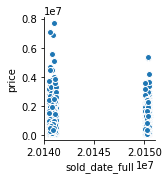

In [94]:
sns.pairplot(house_df_new,x_vars='sold_date_full',y_vars='price')

There are clusters forming up in the time series. Hence, let's split them up into indivdual features - date, month and year

In [95]:
house_df_new['sold_year']=house_df_new['dayhours'].str[:4].astype('int64')
house_df_new['sold_month']=house_df_new['dayhours'].str[4:6].astype('int64')
house_df_new['sold_date']=house_df_new['dayhours'].str[6:8].astype('int64')

In [96]:
house_df_new['sold_year'].head(5)

0    2014
1    2014
2    2015
3    2014
4    2015
Name: sold_year, dtype: int64

In [98]:
house_df_new['sold_month'].head(5)

0    11
1    12
2     4
3     5
4     4
Name: sold_month, dtype: int64

In [99]:
house_df_new['sold_date'].head(5)

0     7
1     4
2    20
3    29
4    24
Name: sold_date, dtype: int64

In [100]:
# having split the dayhours data, dropping the dayhours column from the dataframe

house_df_new=house_df_new.drop('dayhours',axis=1)

In [101]:
house_df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 26 columns):
cid                 21613 non-null int64
price               21613 non-null int64
room_bed            21613 non-null int64
room_bath           21613 non-null float64
living_measure      21613 non-null int64
lot_measure         21613 non-null int64
ceil                21613 non-null float64
coast               21613 non-null int64
sight               21613 non-null int64
condition           21613 non-null int64
quality             21613 non-null int64
ceil_measure        21613 non-null int64
basement            21613 non-null int64
yr_built            21613 non-null int64
yr_renovated        21613 non-null int64
zipcode             21613 non-null int64
lat                 21613 non-null float64
long                21613 non-null float64
living_measure15    21613 non-null int64
lot_measure15       21613 non-null int64
furnished           21613 non-null int64
total_area          21

In [8]:
house_df_new.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
cid,21613.0,4.580302e+09,2.876566e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21613.0,5.401822e+05,3.673622e+05,7.500000e+04,3.219500e+05,4.500000e+05,6.450000e+05,7.700000e+06
room_bed,21613.0,3.370842e+00,9.300618e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
room_bath,21613.0,2.114757e+00,7.701632e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
living_measure,21613.0,2.079900e+03,9.184409e+02,2.900000e+02,1.427000e+03,1.910000e+03,2.550000e+03,1.354000e+04
lot_measure,21613.0,1.510697e+04,4.142051e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068800e+04,1.651359e+06
ceil,21613.0,1.494309e+00,5.399889e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
coast,21613.0,7.541757e-03,8.651720e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
sight,21613.0,2.343034e-01,7.663176e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21613.0,3.409430e+00,6.507430e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


# Checking for missing values

In [16]:
house_df_new.isna().sum(axis=0)

cid                 0
price               0
room_bed            0
room_bath           0
living_measure      0
lot_measure         0
ceil                0
coast               0
sight               0
condition           0
quality             0
ceil_measure        0
basement            0
yr_built            0
yr_renovated        0
zipcode             0
lat                 0
long                0
living_measure15    0
lot_measure15       0
furnished           0
total_area          0
dtype: int64

There are no missing values in the dataset.

# Deliverable -1 (Exploratory data quality report reflecting the following)


# 1. Univariate analysis

Univariate analysis – data types and description of the independent attributes which should include (name, meaning, range of values observed, central values (mean and median), standard deviation and quartiles, analysis of the body of distributions / tails, missing values, outliers

In [102]:
house_df_new.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
cid,21613.0,4.580302e+09,2.876566e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21613.0,5.401822e+05,3.673622e+05,7.500000e+04,3.219500e+05,4.500000e+05,6.450000e+05,7.700000e+06
room_bed,21613.0,3.370842e+00,9.300618e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
room_bath,21613.0,2.114757e+00,7.701632e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
living_measure,21613.0,2.079900e+03,9.184409e+02,2.900000e+02,1.427000e+03,1.910000e+03,2.550000e+03,1.354000e+04
lot_measure,21613.0,1.510697e+04,4.142051e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068800e+04,1.651359e+06
ceil,21613.0,1.494309e+00,5.399889e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
coast,21613.0,7.541757e-03,8.651720e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
sight,21613.0,2.343034e-01,7.663176e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21613.0,3.409430e+00,6.507430e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


# Check the input variable distribution

## Variable: CID -> A notation for the house

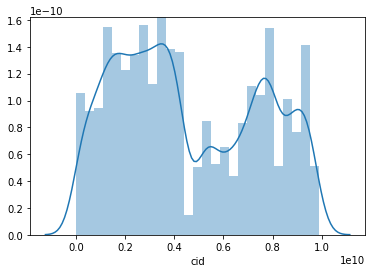

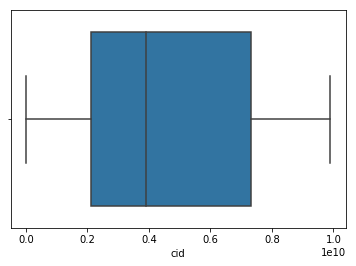

In [109]:
sns.distplot(house_df_new['cid'])
plt.show()
sns.boxplot(house_df_new['cid'])

In [125]:
house_df_f=house_df_new.copy()
house_df_f['cid_id']=house_df_new['cid'].duplicated()

In [133]:
house_df_f.loc[house_df_f['cid_id'] == True].shape

(177, 27)

There are a total of 177 duplicate entries in the dataframe. Let's look into the nature of the duplicates and check if they ar really duplicates

In [135]:
# Listing the top 5 duplicate entries

house_df_f.loc[house_df_f['cid_id'] == True].sort_values(by='cid').head(5)

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,...,long,living_measure15,lot_measure15,furnished,total_area,sold_year,sold_month,sold_date,sold_date_full,cid_id
17038,1000102,280000,6,3.00,2400,9373,2.0,0,0,3,...,-122.214,2060,7316,0,11773,2014,9,16,20140916,True
19995,7200179,150000,2,1.00,840,12750,1.0,0,0,3,...,-122.211,1480,6969,0,13590,2014,10,16,20141016,True
17161,109200390,245000,3,1.75,1480,3900,1.0,0,0,4,...,-122.367,1830,6956,0,5380,2014,8,20,20140820,True
12964,123039336,148000,1,1.00,620,8261,1.0,0,0,3,...,-122.364,1180,8244,0,8881,2014,6,11,20140611,True
8544,251300110,225000,3,2.25,2510,12013,2.0,0,0,3,...,-122.314,1870,8017,0,14523,2014,7,31,20140731,True


In [144]:
# returning all instances of the first 5 duplicate entries

house_df_f.loc[house_df_f['cid'].isin(['1000102','7200179','109200390','123039336','251300110'])].sort_values(by='cid')

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,...,long,living_measure15,lot_measure15,furnished,total_area,sold_year,sold_month,sold_date,sold_date_full,cid_id
3405,1000102,300000,6,3.00,2400,9373,2.0,0,0,3,...,-122.214,2060,7316,0,11773,2015,4,22,20150422,False
17038,1000102,280000,6,3.00,2400,9373,2.0,0,0,3,...,-122.214,2060,7316,0,11773,2014,9,16,20140916,True
3874,7200179,175000,2,1.00,840,12750,1.0,0,0,3,...,-122.211,1480,6969,0,13590,2015,4,24,20150424,False
19995,7200179,150000,2,1.00,840,12750,1.0,0,0,3,...,-122.211,1480,6969,0,13590,2014,10,16,20141016,True
1727,109200390,250000,3,1.75,1480,3900,1.0,0,0,4,...,-122.367,1830,6956,0,5380,2014,10,20,20141020,False
17161,109200390,245000,3,1.75,1480,3900,1.0,0,0,4,...,-122.367,1830,6956,0,5380,2014,8,20,20140820,True
8438,123039336,244900,1,1.00,620,8261,1.0,0,0,3,...,-122.364,1180,8244,0,8881,2014,12,8,20141208,False
12964,123039336,148000,1,1.00,620,8261,1.0,0,0,3,...,-122.364,1180,8244,0,8881,2014,6,11,20140611,True
5441,251300110,358000,3,2.25,2510,12013,2.0,0,0,3,...,-122.314,1870,8017,0,14523,2015,1,14,20150114,False
8544,251300110,225000,3,2.25,2510,12013,2.0,0,0,3,...,-122.314,1870,8017,0,14523,2014,7,31,20140731,True


### Inference

No outliers present in this variable. This is an identification variable only. There are certain repeated entries indicating the same property has been bought and resold. 

Note: Can be dropped for regression analysis.

Outliers treatment is required here.

# Multivariate Analysis


# 2. Multivariate analysis

Bi-variate analysis between the predictor variables and target column. Comment on your findings in terms of their relationship and degree of relation if any. Presence of leverage points. Visualize the analysis using boxplots and pair plots, histograms or density curves. Select the most appropriate attributes

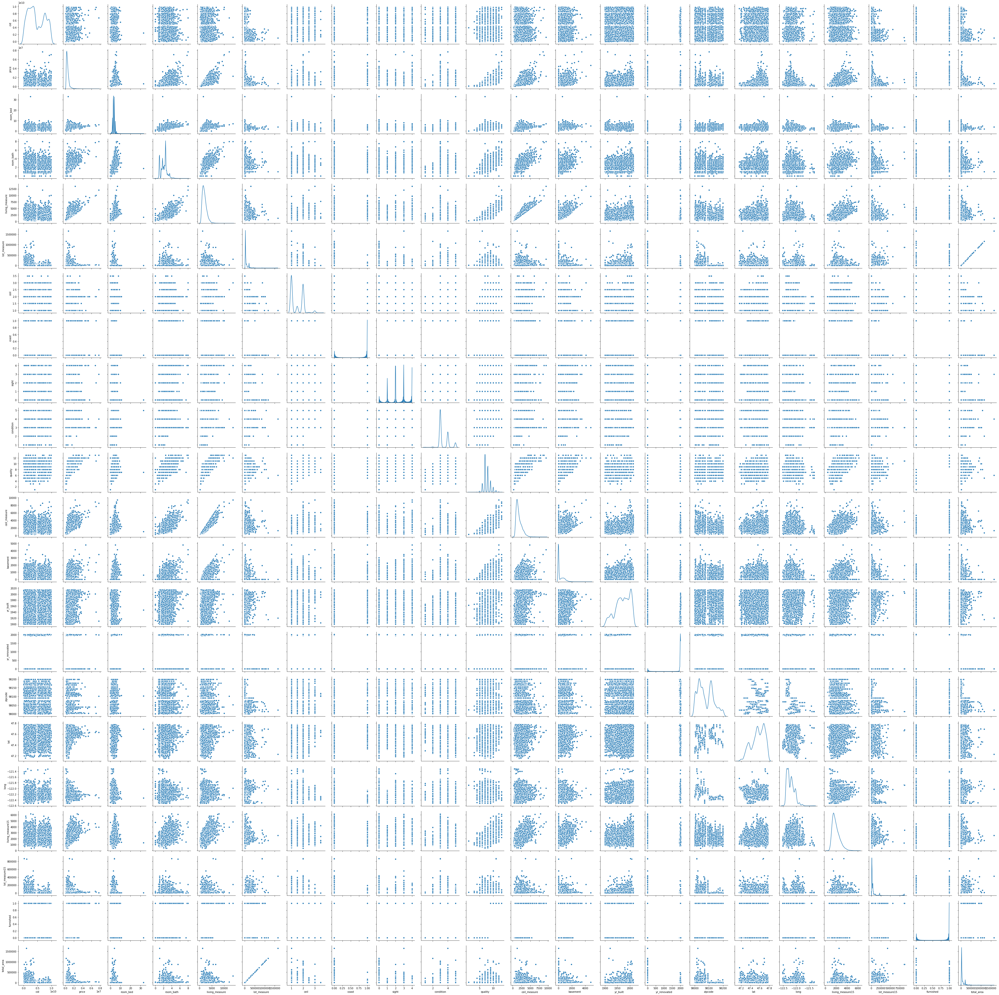

In [13]:
sns.pairplot(df_new, diag_kind= 'kde')

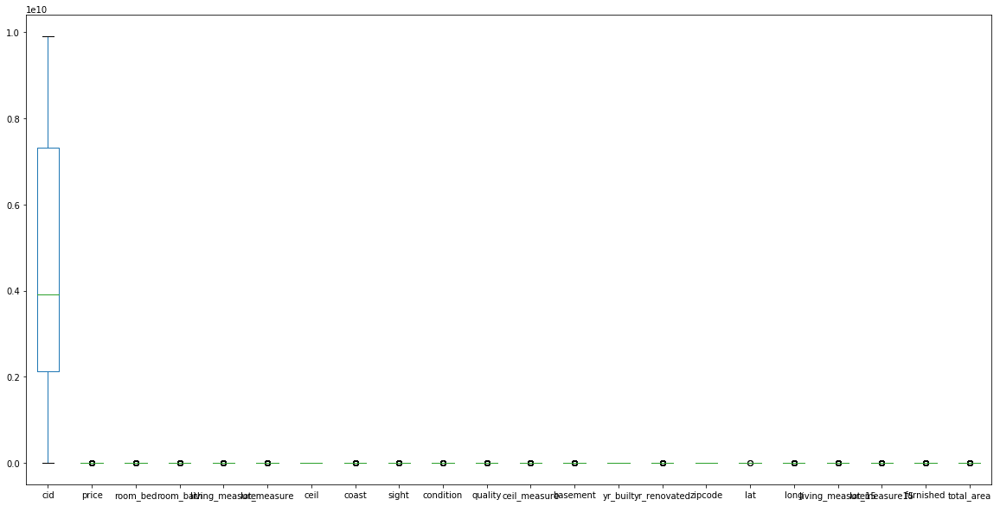

In [15]:
df_new.plot(kind= 'box', figsize= (20,10))

Outlier treatment is required here

# Corelation analysis

In [25]:
X=house_scaled_df.drop('price',axis=1)

In [66]:
X_corr=X.corr()

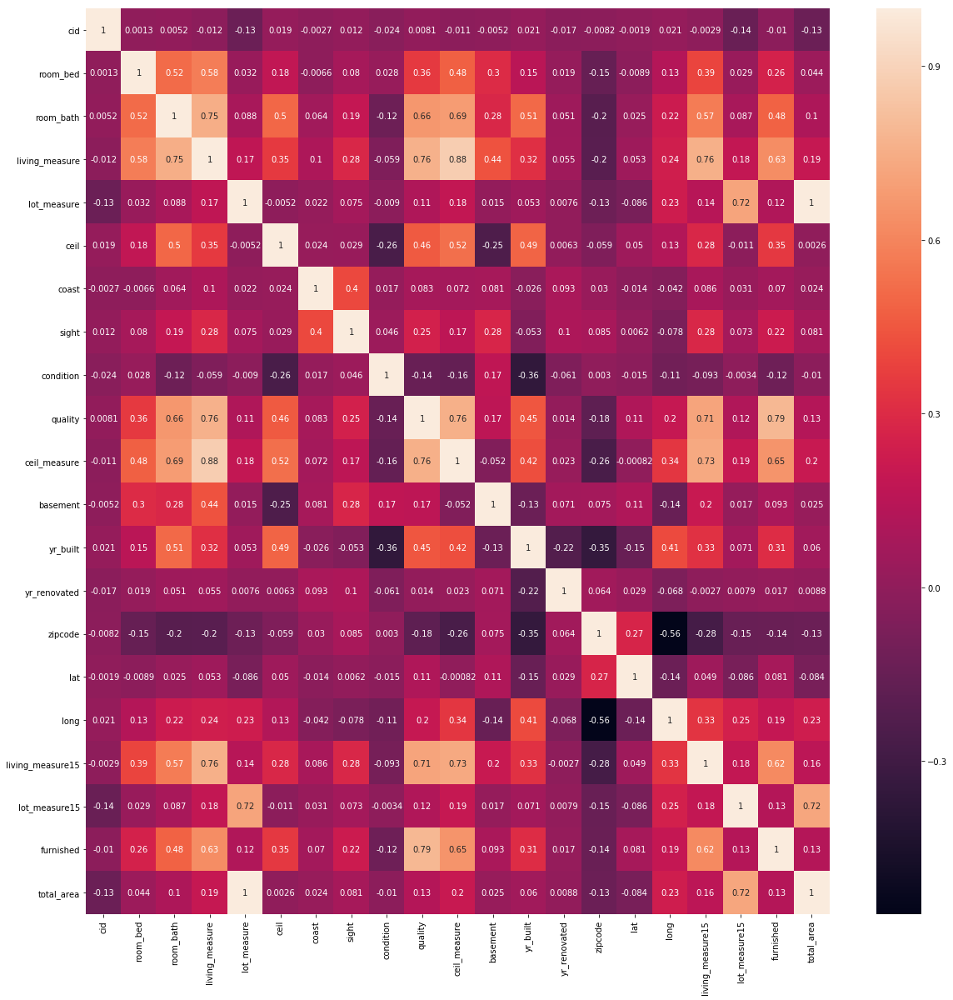

In [71]:
fig, ax = plt.subplots(figsize=(20,20))   
sns.heatmap(X_corr,annot=True)

## Inference

Iot_measure and total_area are very strongly corelated. Likewise ceiling measure and living measure are highly corelated. As there are strong positive corelations between some of the input variables, we can do a PCA to reduce the dimensions

In [20]:
# Normalizing the dataframe to evaluate the spread across the elements in a similar fashion

from scipy.stats import zscore

house_scaled_df = house_df_new.apply(zscore)

#convert the numpy array back into a dataframe 

house_scaled_df = pd.DataFrame(house_scaled_df, columns=house_df_new.columns)

#Evaluating the scaled dataframe

house_scaled_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
cid,21613.0,1.127123e-16,1.000023,-1.591970,-0.854251,-0.234789,0.948583,1.849366
price,21613.0,1.398194e-16,1.000023,-1.266306,-0.594065,-0.245491,0.285332,19.490255
room_bed,21613.0,6.211429e-16,1.000023,-3.624404,-0.398737,-0.398737,0.676485,31.857929
room_bath,21613.0,-7.217657e-16,1.000023,-2.745920,-0.473621,0.175607,0.500221,7.641730
living_measure,21613.0,2.346093e-16,1.000023,-1.948891,-0.710895,-0.184991,0.511858,12.478065
lot_measure,21613.0,1.235099e-16,1.000023,-0.352176,-0.243049,-0.180808,-0.106688,39.504338
ceil,21613.0,3.510111e-16,1.000023,-0.915427,-0.915427,0.010539,0.936506,3.714405
coast,21613.0,9.505755e-16,1.000023,-0.087173,-0.087173,-0.087173,-0.087173,11.471490
sight,21613.0,4.855953e-15,1.000023,-0.305759,-0.305759,-0.305759,-0.305759,4.914129
condition,21613.0,1.079186e-15,1.000023,-3.702668,-0.629187,-0.629187,0.907554,2.444294


In [26]:
X.head(5)

,cid,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,...,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,-0.537494,0.676485,1.474063,1.023606,-0.039835,-0.915427,-0.087173,-0.305759,2.444294,1.142667,...,-0.658681,-0.510853,-0.210128,1.029090,1.135587,-0.867059,0.194707,-0.191018,2.020944,-0.017069
1,1.443310,0.676485,0.500221,0.511858,-0.183656,-0.915427,-0.087173,-0.305759,-0.629187,0.291916,...,1.148964,0.170051,-0.210128,-1.026840,-1.757734,-1.222109,0.398975,-0.145346,-0.494818,-0.171608
2,0.182245,-0.398737,0.500221,0.315869,-0.260335,0.936506,-0.087173,-0.305759,-0.629187,0.291916,...,-0.658681,1.191407,-0.210128,-0.746486,-1.505137,1.525981,0.559471,-0.308402,-0.494818,-0.252304
3,0.544168,-1.473959,-1.447464,-1.371813,-0.271924,-0.915427,-0.087173,-0.305759,0.907554,-1.409587,...,-0.658681,-1.872660,-0.210128,1.029090,1.045374,-0.959372,-0.680725,-0.326861,-0.494818,-0.301116
4,1.510099,-1.473959,-0.798235,-0.740293,-0.266950,-0.915427,-0.087173,-0.305759,0.907554,0.291916,...,-0.658681,-0.578943,-0.210128,0.692665,0.842574,-0.391291,-0.126285,-0.250094,-0.494818,-0.282217


In [22]:
from sklearn.decomposition import PCA

In [42]:
pca=PCA(0.95)

In [57]:
X_pca=pca.fit_transform(X)

In [58]:
pca.n_components_

15

In [59]:
pca.explained_variance_ratio_

array([0.27698955, 0.12654643, 0.1032911 , 0.06837598, 0.05957237,
       0.04812769, 0.04605289, 0.04397805, 0.03977689, 0.03550289,
       0.02868956, 0.02512422, 0.01975571, 0.01757395, 0.01685006])

To explain a variance of 95% in the dataframe, PCA is employed to transform the base dataset into one with 15 features. 

In [60]:
house_df_pca=pd.DataFrame(data=X_pca,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15'])

In [62]:
house_df_pca.shape

(21613, 15)

In [63]:
house_df_pca.describe()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
count,2.161300e+04,2.161300e+04,2.161300e+04,2.161300e+04,2.161300e+04,2.161300e+04,2.161300e+04,2.161300e+04,2.161300e+04,2.161300e+04,2.161300e+04,2.161300e+04,2.161300e+04,2.161300e+04,2.161300e+04
mean,8.424401e-18,5.690323e-17,2.315105e-17,-9.965450e-19,3.005045e-17,3.155041e-17,-4.281034e-17,-3.753225e-17,6.531479e-18,-2.143599e-17,4.937521e-17,3.018273e-17,-4.665269e-17,2.520771e-17,2.071427e-17
std,2.411856e+00,1.630214e+00,1.472825e+00,1.198316e+00,1.118516e+00,1.005350e+00,9.834406e-01,9.610316e-01,9.139767e-01,8.634785e-01,7.762143e-01,7.263835e-01,6.441189e-01,6.075113e-01,5.948677e-01
min,-5.060992e+00,-4.502135e+00,-3.808274e+00,-9.017766e+00,-7.529162e+00,-4.223845e+00,-3.567122e+00,-4.574585e+00,-4.584369e+00,-3.147647e+00,-2.960465e+00,-4.619564e+00,-3.471115e+00,-4.912045e+00,-1.049299e+01
25%,-1.726678e+00,-6.726136e-01,-1.102598e+00,-7.829745e-01,-5.867632e-01,-4.457796e-01,-7.948851e-01,-6.834791e-01,-5.905191e-01,-5.777394e-01,-4.997632e-01,-2.334369e-01,-3.944419e-01,-3.637890e-01,-2.038579e-01
50%,-4.125542e-01,-1.834268e-01,-1.485190e-01,-3.933761e-03,-1.079726e-01,-1.406239e-01,-1.264450e-01,-1.960684e-02,4.231896e-03,-1.293552e-02,2.494765e-02,7.535234e-02,1.094451e-02,-6.914684e-03,4.747514e-03
75%,1.316607e+00,2.994905e-01,8.356177e-01,7.817000e-01,4.510804e-01,1.745046e-01,8.581796e-01,6.673506e-01,5.769391e-01,5.234120e-01,5.051677e-01,3.481466e-01,4.344430e-01,3.507750e-01,2.182187e-01
max,2.005338e+01,5.124678e+01,1.156535e+01,1.063927e+01,1.130905e+01,6.576396e+00,5.865196e+00,8.743999e+00,4.598786e+00,1.095472e+01,1.512896e+01,5.649617e+00,9.247213e+00,1.096262e+01,1.643822e+01


# k means clustering

Text(0.5,1,'Selecting k with the Elbow Method')

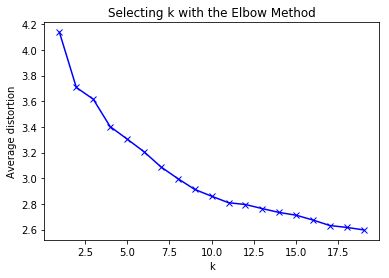

In [74]:
attributes = house_scaled_df.drop('price',axis=1)

#Finding optimal no. of clusters
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
clusters=range(1,20)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(attributes)
    prediction=model.predict(attributes)
    meanDistortions.append(sum(np.min(cdist(attributes, model.cluster_centers_, 'euclidean'), axis=1)) / attributes.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')


In [75]:
#  K = 4
final_model=KMeans(4)
final_model.fit(attributes)
prediction=final_model.predict(attributes)

#Append the prediction 
house_scaled_df["GROUP"] = prediction
print("Groups Assigned : \n")
house_scaled_df[["price", "GROUP"]].head(5)

Groups Assigned : 



,price,GROUP
0,0.729318,1
1,-0.715066,0
2,-0.370711,0
3,-0.653817,2
4,0.432329,2


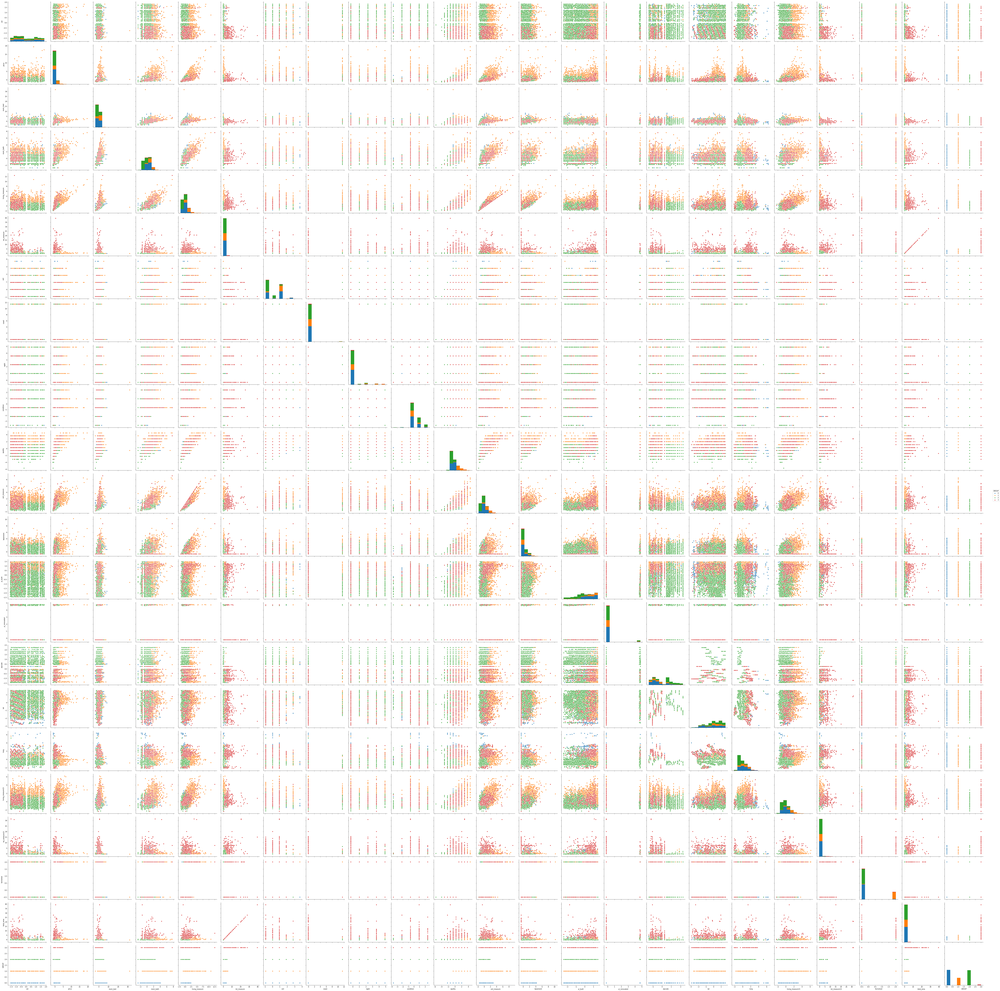

In [77]:
sns.pairplot(house_scaled_df,hue='GROUP',size=4)

In [85]:
house_scaled_df.groupby(by='GROUP',axis=0).count()

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,...,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
GROUP,,,,,,,,,,,,,,,,,,,,,
0,8679,8679,8679,8679,8679,8679,8679,8679,8679,8679,...,8679,8679,8679,8679,8679,8679,8679,8679,8679,8679
1,4104,4104,4104,4104,4104,4104,4104,4104,4104,4104,...,4104,4104,4104,4104,4104,4104,4104,4104,4104,4104
2,8468,8468,8468,8468,8468,8468,8468,8468,8468,8468,...,8468,8468,8468,8468,8468,8468,8468,8468,8468,8468
3,362,362,362,362,362,362,362,362,362,362,...,362,362,362,362,362,362,362,362,362,362


The group 0 and 2 contain similar number of samples, however, in group 3 there is very low number of samples.

There are total 21613 entities. Hence, let's upsample and downsample among the 4 groups to a mean sample size of 5404 samples each.

In [1]:
conda install -c glemaitre imbalanced-learn

SyntaxError: invalid syntax (<ipython-input-1-f69acc25df63>, line 1)

In [86]:
from imblearn.over_sampling import SMOTE

ModuleNotFoundError: No module named 'imblearn'